In [1]:
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
sns.set()

,Expanded Sequence,sgRNA Score,sgRNA Rank,sgRNA Normalized,A1,AA1,AG1,AC1,AT1,A?,...,TGT,TCA,TCG,TCC,TCT,TTA,TTG,TTC,TTT,Delta G
0,GGCCGTAATGGCTTCCTCGTGAGTTGGTCC,0.325738,2708.0,0.410978,0,0,0,0,0,1,...,0,0,1,1,0,0,1,1,0,-41
1,AGAAGCTCGTGCGAGTGATAGACCAGGAGA,0.162559,1558.0,0.236425,1,0,1,0,0,1,...,0,0,1,0,0,0,0,0,0,-39
2,ATGGCACGGACGGTATATGGCAGGAGGTGG,0.035653,360.0,0.054586,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,-41
3,TGGCTACTTCTGCGAGACACGGACAGGTCG,0.311042,2602.0,0.394889,0,0,0,0,0,1,...,0,0,1,0,1,0,0,1,0,-42
4,ACTTCGGCCCACGCTACTACAGTTCGGGCT,0.199951,1844.0,0.279835,1,0,0,1,0,1,...,0,0,1,0,0,0,0,1,0,-42


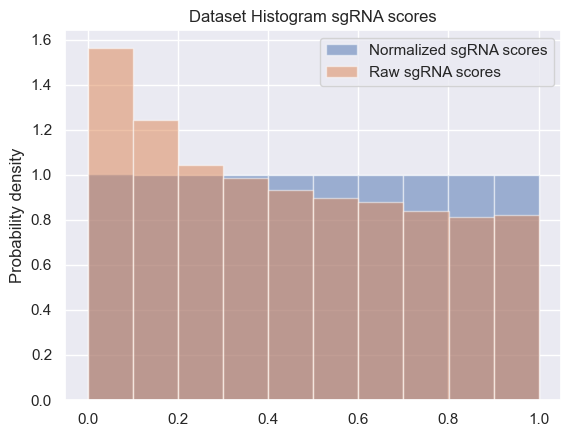

In [28]:
df = pd.read_csv("../data/Doench_Fusi_V2_Featurized.csv", index_col=0)
plt.hist(df["sgRNA Normalized"], alpha=0.5, density=True, label='Normalized sgRNA scores')
plt.hist(df["sgRNA Score"], alpha=0.5, density=True, label='Raw sgRNA scores')
plt.ylabel('Probability density')
plt.title("Dataset Histogram sgRNA scores")
plt.legend()
df.head()

In [6]:
df.shape

(6588, 2495)

In [132]:
from gensim.models import Word2Vec

def w2vEmbedding(texts, embeddingSize=200) -> Word2Vec:
    # Train the Word2Vec model from Gensim. 
    # Below are the hyperparameters that are most relevant. 
    # But feel free to explore other 
    # options too:
    sg = 1 # skip-gram
    window = 5
    vector_size = embeddingSize
    min_count = 1

    model = Word2Vec(sg=sg, window=window, vector_size=vector_size, min_count=min_count)
    model.build_vocab(texts)
    return model

In [30]:
EMBEDDINGS_SIZE = 25

w2vmodel_sequence = w2vEmbedding(df["Expanded Sequence"], EMBEDDINGS_SIZE)

In [31]:
print('Vocab size {}'.format(len(w2vmodel_sequence.wv)))
vocab_shakespeare = len(w2vmodel_sequence.wv)

Vocab size 4


In [32]:
w2vmodel_sequence.wv.save_word2vec_format('sequence_embeddings.txt', binary=False)

In [33]:
embeddings = []
for _seq in df["Expanded Sequence"]:
    xEmb = []
    for _x in _seq:
        xEmb.extend(w2vmodel_sequence.wv[_x])
    embeddings.append(xEmb)

In [26]:
embeddings

[[-0.002144909,
  0.0009457254,
  0.020413399,
  0.03603709,
  -0.037211798,
  -0.028467236,
  0.02583549,
  0.035891954,
  -0.020061713,
  -0.015053486,
  0.029522019,
  -0.0061338856,
  -0.018146453,
  0.026216207,
  -0.019440642,
  -0.0072640707,
  0.011506319,
  0.003967495,
  -0.03314086,
  -0.03779527,
  0.029247064,
  0.020281048,
  0.027030773,
  0.0030514621,
  0.025403561,
  -0.002144909,
  0.0009457254,
  0.020413399,
  0.03603709,
  -0.037211798,
  -0.028467236,
  0.02583549,
  0.035891954,
  -0.020061713,
  -0.015053486,
  0.029522019,
  -0.0061338856,
  -0.018146453,
  0.026216207,
  -0.019440642,
  -0.0072640707,
  0.011506319,
  0.003967495,
  -0.03314086,
  -0.03779527,
  0.029247064,
  0.020281048,
  0.027030773,
  0.0030514621,
  0.025403561,
  -0.013621463,
  -0.0037856055,
  0.023074294,
  -0.03008655,
  -0.015744414,
  -0.030046329,
  -0.003720169,
  0.038152475,
  -0.029276667,
  -0.009335075,
  -0.0077509643,
  0.03230975,
  -0.023723584,
  0.00018064976,
  -0.0

In [34]:
np.array(embeddings).shape

(6588, 750)

In [35]:
np.array(embeddings).dtype

dtype('float32')

In [74]:
df["Embedded Sequences"] = embeddings

In [38]:
dfEmb = df.copy(deep=True)[["Expanded Sequence", "sgRNA Normalized", "Embedded Sequences"]]

In [76]:
_emb = np.array(embeddings)
dfEmb["Embedded Sequences"] = embeddings

In [78]:
dfEmb["Embedded Sequences"]

0       [-0.002144909, 0.0009457254, 0.020413399, 0.03...
1       [-0.03263167, 0.017983193, -0.016548304, 0.003...
2       [-0.03263167, 0.017983193, -0.016548304, 0.003...
3       [0.0022871399, 0.029767632, -0.003253131, -0.0...
4       [-0.03263167, 0.017983193, -0.016548304, 0.003...
                              ...                        
6583    [-0.002144909, 0.0009457254, 0.020413399, 0.03...
6584    [0.0022871399, 0.029767632, -0.003253131, -0.0...
6585    [-0.002144909, 0.0009457254, 0.020413399, 0.03...
6586    [-0.013621463, -0.0037856055, 0.023074294, -0....
6587    [-0.013621463, -0.0037856055, 0.023074294, -0....
Name: Embedded Sequences, Length: 6588, dtype: object

In [79]:
dfEmb.dtypes

Expanded Sequence      object
sgRNA Normalized      float64
Embedded Sequences     object
dtype: object

In [82]:
np.array(dfEmb["Embedded Sequences"][0]).dtype

dtype('float32')

In [47]:
import csv
dfEmb.to_csv("embedded sequence data.csv", quoting=csv.QUOTE_NONNUMERIC)

In [49]:
dfEmb = pd.read_csv("embedded sequence data.csv")
dfEmb.head()

,Unnamed: 0,Expanded Sequence,sgRNA Normalized,Embedded Sequences
0,0,GGCCGTAATGGCTTCCTCGTGAGTTGGTCC,0.410978,-0.002145
1,1,AGAAGCTCGTGCGAGTGATAGACCAGGAGA,0.236425,-0.032632
2,2,ATGGCACGGACGGTATATGGCAGGAGGTGG,0.054586,-0.032632
3,3,TGGCTACTTCTGCGAGACACGGACAGGTCG,0.394889,0.002287
4,4,ACTTCGGCCCACGCTACTACAGTTCGGGCT,0.279835,-0.032632


In [83]:
from sklearn.model_selection import train_test_split

X = np.array(dfEmb["Embedded Sequences"].values)
Y = np.array(dfEmb["sgRNA Normalized"].values)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [84]:
X_train

array([list([-0.03263167, 0.017983193, -0.016548304, 0.0032981443, 0.03399448, -0.017848706, 0.018070001, -0.02714784, -0.014193955, 0.03759403, -0.0063106106, 0.0012854863, -0.01656252, -0.030730752, -0.006032033, 0.009879179, -0.0035521078, 0.022134647, -0.010971908, 0.009040261, 0.021823177, 0.033383813, -0.0058149626, -0.03683257, 0.01748221, -0.03263167, 0.017983193, -0.016548304, 0.0032981443, 0.03399448, -0.017848706, 0.018070001, -0.02714784, -0.014193955, 0.03759403, -0.0063106106, 0.0012854863, -0.01656252, -0.030730752, -0.006032033, 0.009879179, -0.0035521078, 0.022134647, -0.010971908, 0.009040261, 0.021823177, 0.033383813, -0.0058149626, -0.03683257, 0.01748221, -0.03263167, 0.017983193, -0.016548304, 0.0032981443, 0.03399448, -0.017848706, 0.018070001, -0.02714784, -0.014193955, 0.03759403, -0.0063106106, 0.0012854863, -0.01656252, -0.030730752, -0.006032033, 0.009879179, -0.0035521078, 0.022134647, -0.010971908, 0.009040261, 0.021823177, 0.033383813, -0.0058149626, -0.0

In [118]:
X_train_np = np.array([np.array(a) for a in X_train])
X_test_np = np.array([np.array(a) for a in X_test])

In [117]:
X_train_np

array([[-0.03263167,  0.01798319, -0.0165483 , ...,  0.03845897,
         0.01992823,  0.03693257],
       [-0.01362146, -0.00378561,  0.02307429, ..., -0.02816624,
         0.00360582,  0.02557014],
       [-0.01362146, -0.00378561,  0.02307429, ..., -0.00581496,
        -0.03683257,  0.01748221],
       ...,
       [-0.01362146, -0.00378561,  0.02307429, ..., -0.02816624,
         0.00360582,  0.02557014],
       [-0.00214491,  0.00094573,  0.0204134 , ...,  0.02703077,
         0.00305146,  0.02540356],
       [-0.03263167,  0.01798319, -0.0165483 , ..., -0.02816624,
         0.00360582,  0.02557014]], dtype=float32)

In [122]:
def data_generator(X: list, y: list, num_sequences_per_batch: int) -> (list,list):
    '''
    Returns data generator to be used by feed_forward
    https://wiki.python.org/moin/Generators
    https://realpython.com/introduction-to-python-generators/
    
    Yields batches of embeddings and labels to go with them.
    Use one hot vectors to encode the labels 
    (see the to_categorical function)
    
    '''

    index = 0
    while (index < len(y)):
        yield (np.array(X[index:index+num_sequences_per_batch]), np.array(y[index:index+num_sequences_per_batch], dtype="float32"))
        index += num_sequences_per_batch


In [123]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

# https://towardsdatascience.com/regression-modelling-with-tensorflow-made-easy-train-your-first-model-in-10-minutes-497d829c7338
def rmse(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

In [172]:
model = Sequential([
    Dense(500, activation='relu'),
    Dense(125, activation='relu'),
    Dense(1)
])

model.compile(loss='mse',
              optimizer='adam',
              metrics=['mse'])

In [173]:
train_generator = data_generator(X_train_np, Y_train, 256)
steps_per_epoch = len(Y_train) // 256

In [174]:
model.fit(x=train_generator, steps_per_epoch=steps_per_epoch, epochs=1, use_multiprocessing=False)

2023-04-14 10:33:11.322387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


202/202 [==============================] - 2s 5ms/step - loss: 0.0635 - mse: 0.0635


,Sequence,sgRNA Score,sgRNA Rank,sgRNA Normalized,A1,AA1,AG1,AC1,AT1,A?,...,TT_PAM,GC Count,Melting Temp Wallace,Melting Temp GC,Melting Temp NN1,Melting Temp NN2,Melting Temp NN3,Melting Temp NN4,GC<10,GC>10
0,TACCCTGGGACTGTACCCCC,215.2632,39133.0,0.604353,0,0,0,0,0,1,...,0,13,66,56,64,58,56,62,0,1
1,ACCCTTGCTGCACGACCTGC,304.1053,47269.0,0.730003,1,0,0,1,0,1,...,0,13,66,56,68,63,59,61,0,1
2,TCGCTCGCCCCGCTCTTCCT,60.7368,14882.0,0.229828,0,0,0,0,0,0,...,0,14,68,58,74,67,62,64,0,1
3,TGACGCCTCGGACGTGTCTG,61.7368,15074.0,0.232793,0,0,0,0,0,1,...,0,13,66,56,67,63,58,59,0,1
4,CGTCATAGCCAATCTTCTTC,116.1053,25878.0,0.399647,0,0,0,0,0,1,...,0,9,58,48,55,53,48,49,1,0


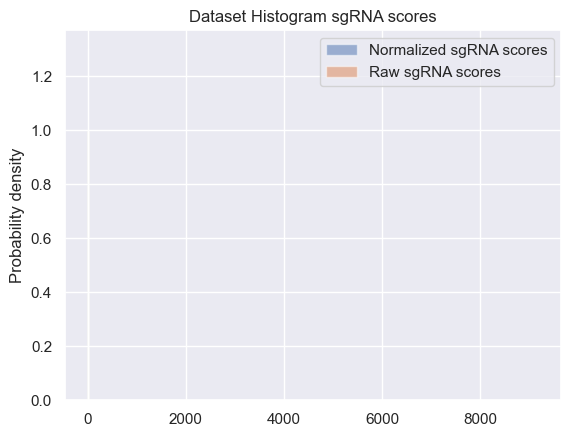

In [131]:
df = pd.read_csv("../data/KO_Data_V1_Featurized.csv", index_col=0)
plt.hist(df["sgRNA Normalized"], alpha=0.5, density=True, label='Normalized sgRNA scores')
plt.hist(df["sgRNA Score"], alpha=0.5, density=True, label='Raw sgRNA scores')
plt.ylabel('Probability density')
plt.title("Dataset Histogram sgRNA scores")
plt.legend()
df.head()

In [133]:
w2vmodel_ko_sequence = w2vEmbedding(df["Sequence"], EMBEDDINGS_SIZE)

In [134]:
embeddings = []
for _seq in df["Sequence"]:
    xEmb = []
    for _x in _seq:
        xEmb.extend(w2vmodel_sequence.wv[_x])
    embeddings.append(xEmb)

In [152]:
df["Embedded Sequence"] = embeddings
dfEmb = df.copy(deep=True)[["Sequence", "sgRNA Normalized", "Embedded Sequence"]]

In [153]:
dfEmb.head()

,Sequence,sgRNA Normalized,Embedded Sequence
0,TACCCTGGGACTGTACCCCC,0.604353,"[0.0022871399, 0.029767632, -0.003253131, -0.0..."
1,ACCCTTGCTGCACGACCTGC,0.730003,"[-0.03263167, 0.017983193, -0.016548304, 0.003..."
2,TCGCTCGCCCCGCTCTTCCT,0.229828,"[0.0022871399, 0.029767632, -0.003253131, -0.0..."
3,TGACGCCTCGGACGTGTCTG,0.232793,"[0.0022871399, 0.029767632, -0.003253131, -0.0..."
4,CGTCATAGCCAATCTTCTTC,0.399647,"[-0.013621463, -0.0037856055, 0.023074294, -0...."


In [138]:
import csv
dfEmb.to_csv("embedded ko sequence data.csv", quoting=csv.QUOTE_NONNUMERIC)

In [139]:
dfEmb = pd.read_csv("embedded ko sequence data.csv")
dfEmb.head()

,Unnamed: 0,Sequence,sgRNA Normalized,Embedded Sequence
0,0,TACCCTGGGACTGTACCCCC,0.604353,"[0.0022871399, 0.029767632, -0.003253131, -0.0..."
1,1,ACCCTTGCTGCACGACCTGC,0.730003,"[-0.03263167, 0.017983193, -0.016548304, 0.003..."
2,2,TCGCTCGCCCCGCTCTTCCT,0.229828,"[0.0022871399, 0.029767632, -0.003253131, -0.0..."
3,3,TGACGCCTCGGACGTGTCTG,0.232793,"[0.0022871399, 0.029767632, -0.003253131, -0.0..."
4,4,CGTCATAGCCAATCTTCTTC,0.399647,"[-0.013621463, -0.0037856055, 0.023074294, -0...."


In [154]:
X = np.array(dfEmb["Embedded Sequence"].values)
Y = np.array(dfEmb["sgRNA Normalized"].values)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [155]:
X_train

array([list([-0.002144909, 0.0009457254, 0.020413399, 0.03603709, -0.037211798, -0.028467236, 0.02583549, 0.035891954, -0.020061713, -0.015053486, 0.029522019, -0.0061338856, -0.018146453, 0.026216207, -0.019440642, -0.0072640707, 0.011506319, 0.003967495, -0.03314086, -0.03779527, 0.029247064, 0.020281048, 0.027030773, 0.0030514621, 0.025403561, -0.013621463, -0.0037856055, 0.023074294, -0.03008655, -0.015744414, -0.030046329, -0.003720169, 0.038152475, -0.029276667, -0.009335075, -0.0077509643, 0.03230975, -0.023723584, 0.00018064976, -0.019014936, -0.038414203, 0.020029172, -0.03503834, -0.017567301, -0.00014039993, -0.0011847258, -0.03064496, 0.038458973, 0.019928232, 0.036932573, -0.03263167, 0.017983193, -0.016548304, 0.0032981443, 0.03399448, -0.017848706, 0.018070001, -0.02714784, -0.014193955, 0.03759403, -0.0063106106, 0.0012854863, -0.01656252, -0.030730752, -0.006032033, 0.009879179, -0.0035521078, 0.022134647, -0.010971908, 0.009040261, 0.021823177, 0.033383813, -0.0058149

In [156]:
X_train_np = np.array([np.array(a) for a in X_train])
X_test_np = np.array([np.array(a) for a in X_test])

In [157]:
X_train_np

array([[-0.00214491,  0.00094573,  0.0204134 , ...,  0.03845897,
         0.01992823,  0.03693257],
       [-0.00214491,  0.00094573,  0.0204134 , ...,  0.03845897,
         0.01992823,  0.03693257],
       [ 0.00228714,  0.02976763, -0.00325313, ..., -0.00581496,
        -0.03683257,  0.01748221],
       ...,
       [ 0.00228714,  0.02976763, -0.00325313, ...,  0.02703077,
         0.00305146,  0.02540356],
       [-0.01362146, -0.00378561,  0.02307429, ...,  0.03845897,
         0.01992823,  0.03693257],
       [-0.01362146, -0.00378561,  0.02307429, ...,  0.02703077,
         0.00305146,  0.02540356]], dtype=float32)

In [158]:
model = Sequential([
    Dense(500, activation='relu'),
    Dense(125, activation='relu'),
    Dense(1)
])

model.compile(loss='mse',
              optimizer='adam',
              metrics=['mse'])

In [159]:
train_generator = data_generator(X_train_np, Y_train, 256)
steps_per_epoch = len(Y_train) // 256

In [ ]:
next(train_generator)

In [160]:
model.fit(x=train_generator, steps_per_epoch=steps_per_epoch, epochs=1, use_multiprocessing=False)

2023-04-13 18:42:02.049689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


202/202 [==============================] - 5s 19ms/step - loss: 0.2210 - rmse: 0.2210


In [168]:
from tensorflow.keras.layers import LSTM

model = Sequential([
    LSTM(500, activation='relu'),
    LSTM(500, activation='relu'),
    Dense(256, activation='relu'),
    Dense(1)
])

model.compile(loss='mse',
              optimizer='adam',
              metrics=['mse'])

In [169]:
train_generator = data_generator(X_train_np, Y_train, 256)
steps_per_epoch = len(Y_train) // 256

In [170]:
next(train_generator)

(array([[-0.00214491,  0.00094573,  0.0204134 , ...,  0.03845897,
          0.01992823,  0.03693257],
        [-0.00214491,  0.00094573,  0.0204134 , ...,  0.03845897,
          0.01992823,  0.03693257],
        [ 0.00228714,  0.02976763, -0.00325313, ..., -0.00581496,
         -0.03683257,  0.01748221],
        ...,
        [-0.01362146, -0.00378561,  0.02307429, ..., -0.02816624,
          0.00360582,  0.02557014],
        [-0.03263167,  0.01798319, -0.0165483 , ..., -0.00581496,
         -0.03683257,  0.01748221],
        [-0.03263167,  0.01798319, -0.0165483 , ...,  0.02703077,
          0.00305146,  0.02540356]], dtype=float32),
 array([0.5462385 , 0.1331345 , 0.25120172, 0.65256846, 0.62529486,
        0.02984691, 0.84467286, 0.832982  , 0.16465512, 0.0345418 ,
        0.39258894, 0.72623503, 0.8947723 , 0.67283064, 0.8902936 ,
        0.93959   , 0.17341171, 0.11616185, 0.17643867, 0.4318932 ,
        0.65103954, 0.36764735, 0.8717921 , 0.3885118 , 0.7633154 ,
        0.8682709 

In [171]:
model.fit(x=train_generator, steps_per_epoch=steps_per_epoch, epochs=1, use_multiprocessing=False)

ValueError: Exception encountered when calling layer 'sequential_11' (type Sequential).

Input 0 of layer "lstm_6" is incompatible with the layer: expected ndim=3, found ndim=2. Full shape received: (256, 500)

Call arguments received by layer 'sequential_11' (type Sequential):
  • inputs=tf.Tensor(shape=(256, 500), dtype=float32)
  • training=False
  • mask=None